In [85]:
import pandas as pd
import joblib
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer

In [ ]:
old_model = joblib.load("model.joblib")

In [87]:
df = pd.read_csv("historical.csv")

binary_cats = ["gender","feeding_type","immunizations_done","reflexes_normal"]

df = df.drop(columns= ["baby_id","name","date"])
df_num = df.drop(columns= binary_cats)

df


,gender,gestational_age_weeks,birth_weight_kg,birth_length_cm,birth_head_circumference_cm,age_days,weight_kg,length_cm,head_circumference_cm,temperature_c,...,oxygen_saturation,feeding_type,feeding_frequency_per_day,urine_output_count,stool_count,jaundice_level_mg_dl,apgar_score,immunizations_done,reflexes_normal,risk_level
0,Female,40.2,3.30,50.0,31.9,1,3.28,50.1,32.0,37.0,...,98,Formula,11,9,0,4.2,7.0,Yes,Yes,At Risk
1,Female,40.2,3.30,50.0,31.9,2,3.35,50.2,32.0,37.2,...,99,Formula,11,5,2,10.6,NaN,No,No,At Risk
2,Female,40.2,3.30,50.0,31.9,3,3.35,50.6,32.1,37.1,...,97,Breastfeeding,7,6,5,9.8,NaN,No,No,Healthy
3,Female,40.2,3.30,50.0,31.9,4,3.48,50.3,32.0,37.4,...,97,Mixed,11,8,4,8.1,NaN,No,Yes,Healthy
4,Female,40.2,3.30,50.0,31.9,5,3.50,50.3,31.8,36.8,...,96,Breastfeeding,11,7,1,11.6,NaN,No,Yes,At Risk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,Female,41.7,4.21,51.3,34.3,26,4.99,52.5,34.8,37.1,...,98,Mixed,8,8,2,2.5,NaN,No,Yes,Healthy
2096,Female,41.7,4.21,51.3,34.3,27,5.04,52.6,34.6,36.8,...,98,Mixed,7,8,4,3.3,NaN,No,Yes,Healthy
2097,Female,41.7,4.21,51.3,34.3,28,5.05,52.9,34.9,37.3,...,97,Mixed,11,6,2,3.2,NaN,No,Yes,Healthy
2098,Female,41.7,4.21,51.3,34.3,29,5.03,52.9,34.8,37.0,...,98,Mixed,10,5,5,3.2,NaN,No,Yes,Healthy


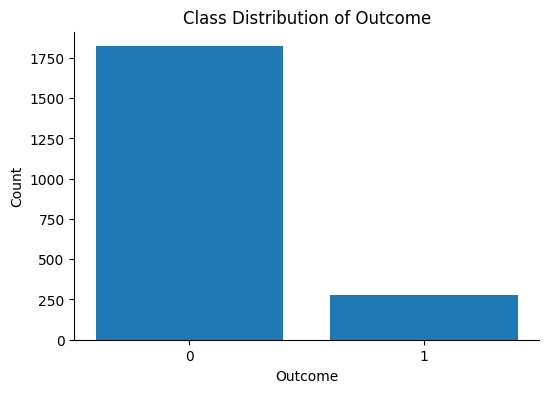

risk_level
0    1822
1     278
Name: count, dtype: int64


In [101]:
class_counts = df["risk_level"].value_counts().sort_index()

# Plot
plt.figure(figsize=(6,4))
plt.bar(class_counts.index.astype(str), class_counts.values)
plt.title("Class Distribution of Outcome")
plt.xlabel("Outcome")
plt.ylabel("Count")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()
print(class_counts)


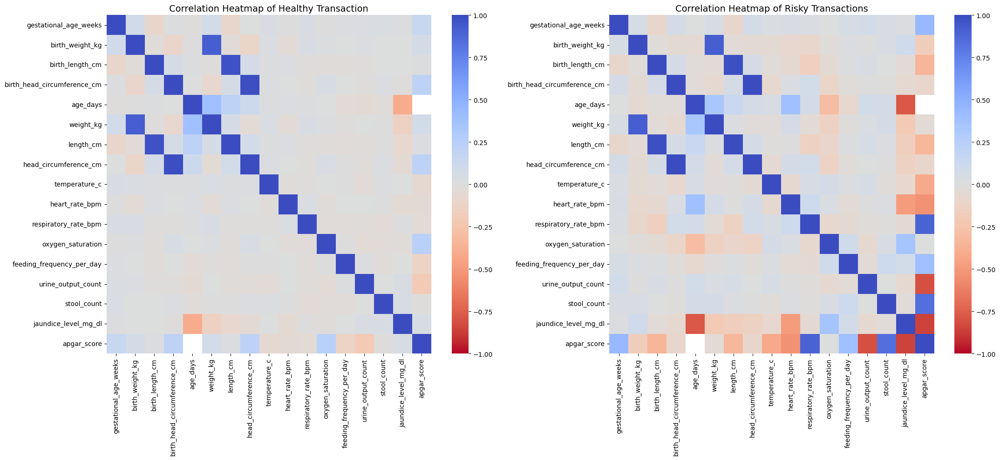

In [91]:
# Split datasets
is_fraud = df["risk_level"] == "At Risk"
is_healthy = df["risk_level"] == "Healthy"
df0_ = df_num[is_healthy]
df_1 = df_num[is_fraud]

# Compute correlation matrices
corr_0 = df_0.iloc[:, :-1].corr()
corr_1 = df_1.iloc[:, :-1].corr()

# Plot side-by-side heatmaps
fig, axes = plt.subplots(1, 2, figsize=(22, 10))

sns.heatmap(
    corr_0,
    cmap="coolwarm_r",
    vmax=1,
    vmin=-1,
    center=0,
    annot=False,
    cbar=True,
    ax=axes[0]
)
axes[0].set_title("Correlation Heatmap of Healthy Transaction", fontsize=14)

sns.heatmap(
    corr_1,
    cmap="coolwarm_r",
    vmax=1,
    vmin=-1,
    center=0,
    annot=False,
    cbar=True,
    ax=axes[1]
)
axes[1].set_title("Correlation Heatmap of Risky Transactions", fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
# Initialize the LabelBinarizer
lb = LabelBinarizer()

# Loop through each specified column and binarize it
for col in binary_cats:
    df[col] = lb.fit_transform(df[[col]])

df['risk_level'] = np.where(df['risk_level'] == 'At Risk', 1, 0)
df["risk_level"].value_counts().sort_index()

risk_level
0    1822
1     278
Name: count, dtype: int64

<Axes: xlabel='age_days', ylabel='jaundice_level_mg_dl'>

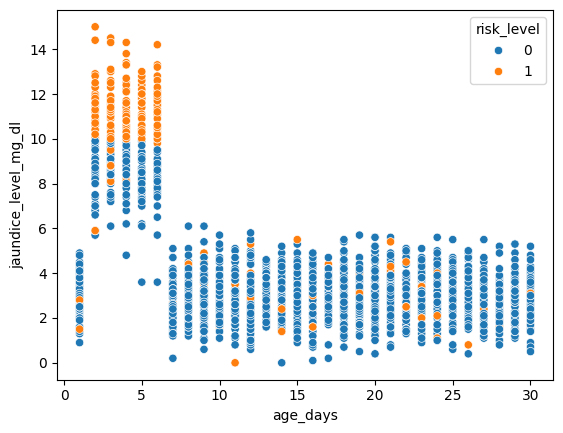

In [98]:
sns.scatterplot(data= df,x="age_days",y="jaundice_level_mg_dl", hue = "risk_level")

<Axes: xlabel='jaundice_level_mg_dl', ylabel='heart_rate_bpm'>

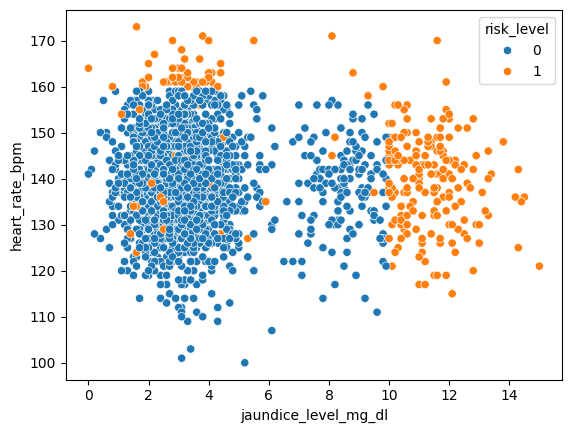

In [95]:
sns.scatterplot(data= df,x="jaundice_level_mg_dl",y="heart_rate_bpm", hue = "risk_level")

<Axes: xlabel='age_days', ylabel='oxygen_saturation'>

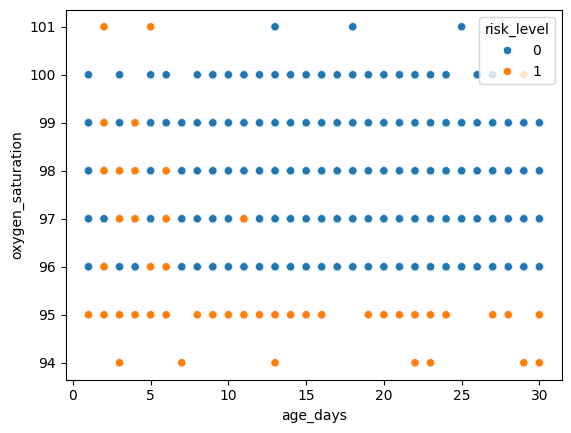

In [97]:
sns.scatterplot(data= df,x="age_days",y="oxygen_saturation", hue = "risk_level")

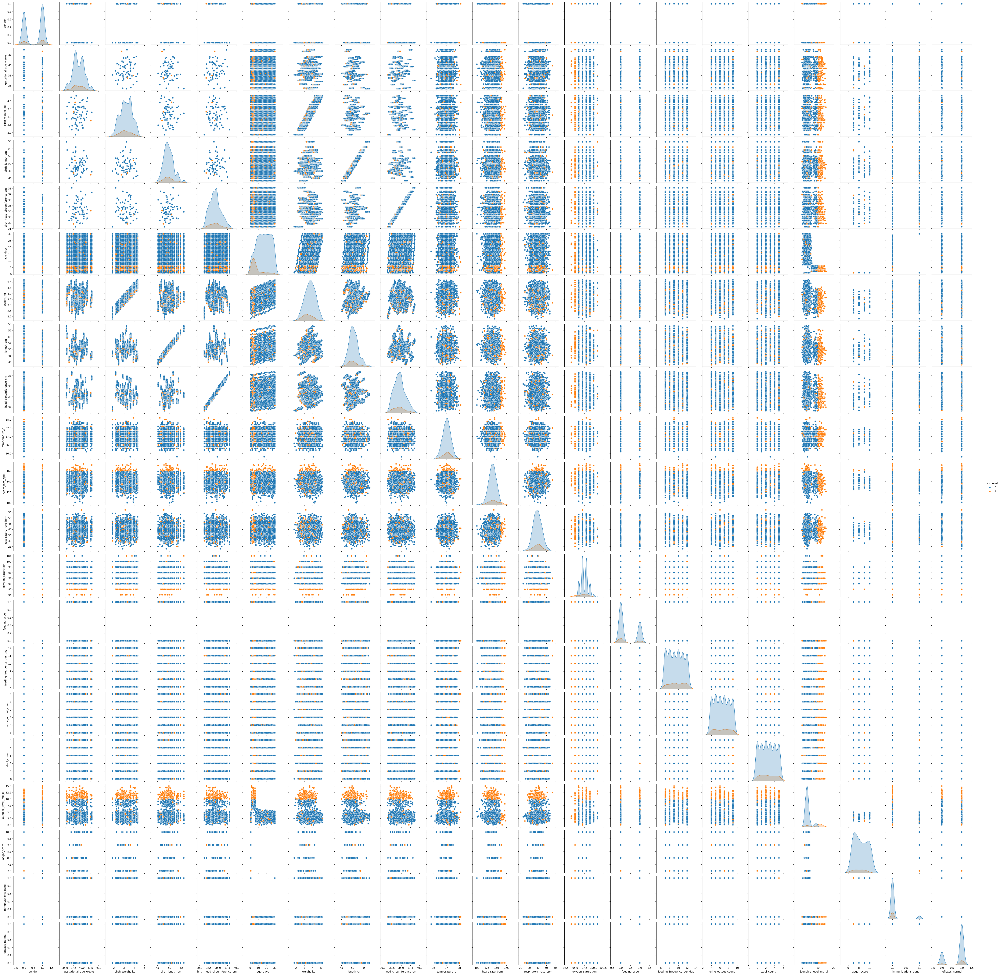

In [99]:
sns.pairplot(data= df,hue="risk_level")